In [ ]:
import pandas as pd

In [ ]:
df= pd.read_csv('/content/Rbooks_df.csv')
df['REVIEW_TITLE']

0                                              Good book
1                         A Day in the Life of a Century
2                                 Books for Album Covers
3                                   Go with the original
4                            The Age of Dead Imagination
                             ...                        
695    It explained all about the people and the way ...
696                                           Great info
697    It was definitely different and something I wo...
698                Must read if your a Follower of Jesus
699                                        Great journal
Name: REVIEW_TITLE, Length: 700, dtype: object

In [ ]:
'''!pip install sentence_transformers'''

'!pip install sentence_transformers'

In [ ]:
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity

In [ ]:
df_reviews = df

In [ ]:
sentences = df_reviews['REVIEW_TEXT']

In [ ]:
model = SentenceTransformer('bert-base-nli-mean-tokens')

In [ ]:
sentence_vecs = model.encode(sentences)
arr=cosine_similarity(sentence_vecs,sentence_vecs)

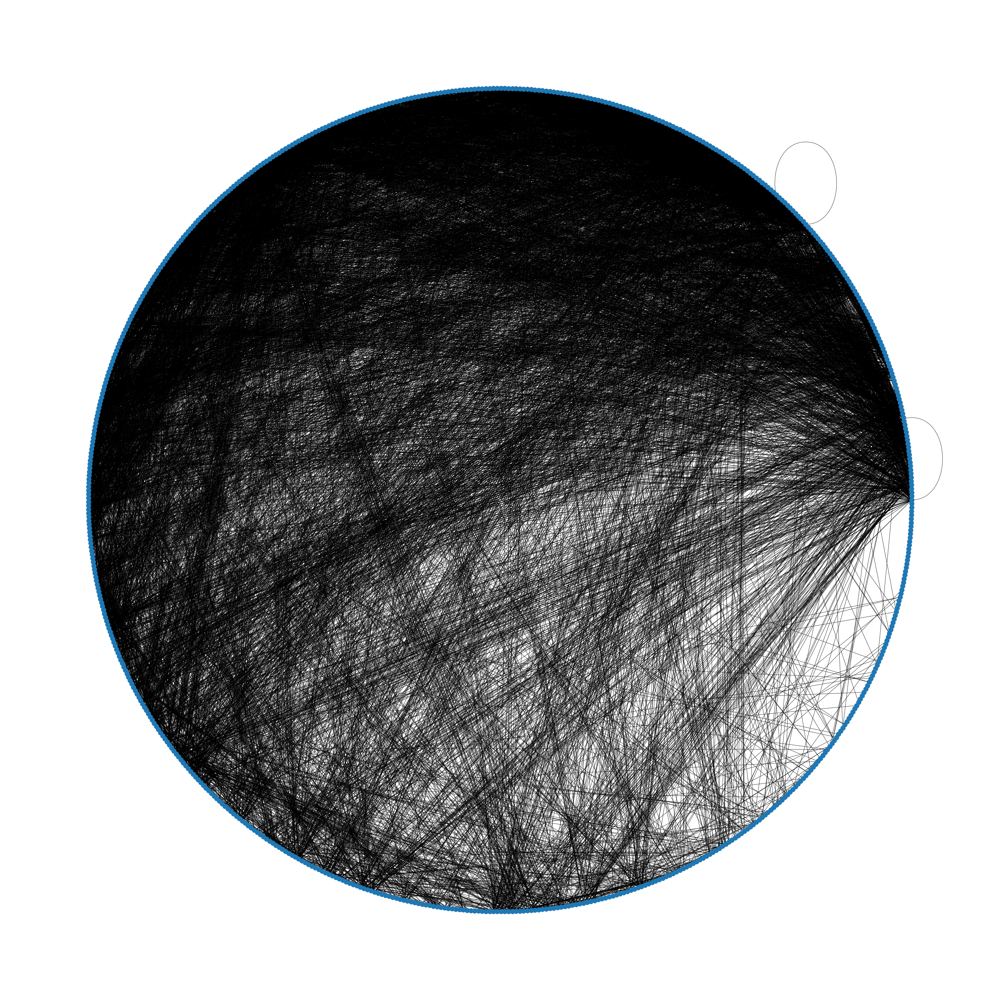

"from google.colab import files\nfiles.download('ECGraphTest_0.75.gml')"

In [ ]:
node_1 = []
node_2 = []
for u in range(0,700) :
    for v in range(0,700) :
        if u!=v and arr[u,v]>0.75:
            node_1.append(df_reviews['REVIEW_TITLE'].loc[u])
            node_2.append(df_reviews['REVIEW_TITLE'].loc[v])
        else:
            node_1.append(df_reviews['REVIEW_TITLE'].loc[u])
            node_2.append(1)

df = pd.DataFrame(list(zip(node_1, node_2)),
               columns =['Column1', 'Column2'])

import networkx as nx
G = nx.Graph()
import matplotlib.pyplot as plt
G = nx.from_pandas_edgelist(df, 'Column1', 'Column2')
G.remove_node(1)

from matplotlib.pyplot import figure
figure(figsize=(50,50))
nx.draw_circular(G)
plt.show()
#plt.savefig("GraphTest_0.75.jpg")
#plt.savefig("GraphTest_0.75.png", format="PNG")
nx.write_gml(G,'GraphTest_0.75.gml')
'''from google.colab import files
files.download('ECGraphTest_0.75.gml')'''

In [ ]:
node_1 = []
node_2 = []
for u in range(0,700) :
    for v in range(0,700) :
        if u!=v and arr[u,v]>0.25:
            node_1.append(df_reviews['REVIEW_TITLE'].loc[u])
            node_2.append(df_reviews['REVIEW_TITLE'].loc[v])
        else:
            node_1.append(df_reviews['REVIEW_TITLE'].loc[u])
            node_2.append(1)

df = pd.DataFrame(list(zip(node_1, node_2)),
               columns =['Column1', 'Column2'])

import networkx as nx
G = nx.Graph()
import matplotlib.pyplot as plt
G = nx.from_pandas_edgelist(df, 'Column1', 'Column2')
G.remove_node(1)

from matplotlib.pyplot import figure
figure(figsize=(50,50))
nx.draw_circular(G)
plt.show()
#plt.savefig("GraphTest_0.25.jpg")
#plt.savefig("GraphTest_0.25.png", format="PNG")
nx.write_gml(G,'GraphTest_0.25.gml')
'''from google.colab import files
files.download('ECGraphTest_0.25.gml')'''

In [ ]:
node_1 = []
node_2 = []
for u in range(0,700) :
    for v in range(0,700) :
        if u!=v and arr[u,v]>0.50:
            node_1.append(df_reviews['REVIEW_TITLE'].loc[u])
            node_2.append(df_reviews['REVIEW_TITLE'].loc[v])
        else:
            node_1.append(df_reviews['REVIEW_TITLE'].loc[u])
            node_2.append(1)

df = pd.DataFrame(list(zip(node_1, node_2)),
               columns =['Column1', 'Column2'])

import networkx as nx
G = nx.Graph()
import matplotlib.pyplot as plt
G = nx.from_pandas_edgelist(df, 'Column1', 'Column2')
G.remove_node(1)

from matplotlib.pyplot import figure
figure(figsize=(50,50))
nx.draw_circular(G)
plt.show()
#plt.savefig("GraphTest_0.50.jpg")
#plt.savefig("GraphTest_0.50.png", format="PNG")
nx.write_gml(G,'GraphTest_0.50.gml')
'''from google.colab import files
files.download('ECGraphTest_0.50.gml')'''

In [ ]:
import networkx as nx

In [ ]:
G1=nx.read_gml('/content/GraphTest_0.75.gml')
num=G1.number_of_nodes()
nx.info(G1)
num

In [ ]:
G2=nx.read_gml('/content/GraphTest_0.50.gml')
G3=nx.read_gml('/content/GraphTest_0.25.gml')

In [ ]:
degrees1 = {node:val for (node, val) in G1.degree()}
x= list(degrees1.keys())
val= list(degrees1.values())

In [ ]:
degrees2 = {node:val for (node, val) in G2.degree()}
x1= list(degrees2.keys())
val1= list(degrees2.values())

In [ ]:
degrees3 = {node:val for (node, val) in G3.degree()}
x2= list(degrees3.keys())
val2= list(degrees3.values())

In [ ]:
df= pd.read_csv('/content/Rbooks_df.csv')
df['REVIEW_TITLE']

In [ ]:
ans_25=[]
for i in range(700):
    temp=0
    for j in range(num):
        if df['REVIEW_TITLE'].iloc[i]== x2[j]:
            temp=val2[j]
    if temp!=0:
        ans_25.append(temp)
    else:
        ans_25.append(None)

In [ ]:
ans_50=[]
for i in range(700):
    temp=0
    for j in range(num):
        if df['REVIEW_TITLE'].iloc[i]== x1[j]:
            temp=val1[j]
    if temp!=0:
        ans_50.append(temp)
    else:
        ans_50.append(None)

In [ ]:
ans_75=[]
for i in range(700):
    temp=0
    for j in range(num):
        if df['REVIEW_TITLE'].iloc[i]== x[j]:
            temp=val[j]
    if temp!=0:
        ans_75.append(temp)
    else:
        ans_75.append(None)

In [ ]:
df['DEGREE_0.25']=ans_25
df['DEGREE_0.50']=ans_50
df['DEGREE_0.75']=ans_75
df

In [ ]:
'''Modified_df_EC= df
from google.colab import files
Modified_df_EC.to_csv('Modified_df_EC.csv')
files.download('Modified_df_EC.csv')'''

In [ ]:
'''Modified_df_GC= df
from google.colab import files
Modified_df_GC.to_csv('Modified_df_GC.csv')
files.download('Modified_df_GC.csv')'''

In [ ]:
Modified_df_book= df
from google.colab import files
Modified_df_book.to_csv('Modified_df_book.csv')
files.download('Modified_df_book.csv')